## Temperature Forecast Project using ML

 This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

# Attribute Information:

For more information, read [Cho et al, 2020].
1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T

Please note that there are two target variables here: 

1) Next_Tmax: Next day maximum temperature

2) Next_Tmin: Next day  minimum temperature



# Importing

In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [7]:
df = pd.read_csv('Temperature Forecast')
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [8]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [9]:
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

1. All attributes are in float type
2. Date is in Object type which we have to change

In [12]:
df.Date

0       30-06-2013
1       30-06-2013
2       30-06-2013
3       30-06-2013
4       30-06-2013
           ...    
7747    30-08-2017
7748    30-08-2017
7749    30-08-2017
7750           NaN
7751           NaN
Name: Date, Length: 7752, dtype: object

In [13]:
df['Date']=pd.to_datetime(df['Date'])

In [14]:
df['Date']

0      2013-06-30
1      2013-06-30
2      2013-06-30
3      2013-06-30
4      2013-06-30
          ...    
7747   2017-08-30
7748   2017-08-30
7749   2017-08-30
7750          NaT
7751          NaT
Name: Date, Length: 7752, dtype: datetime64[ns]

Format has been changed

In [15]:
df['Month']=df['Date'].dt.month
df['Day']=df['Date'].dt.day
df['Year']=df['Date'].dt.year

In [16]:
df.drop('Date',axis=1,inplace=True)

In [17]:
# we have removed the Date column and splitted the same into Day,month and year

# lets check null value

<AxesSubplot:title={'center':'Heatmap for Null values'}>

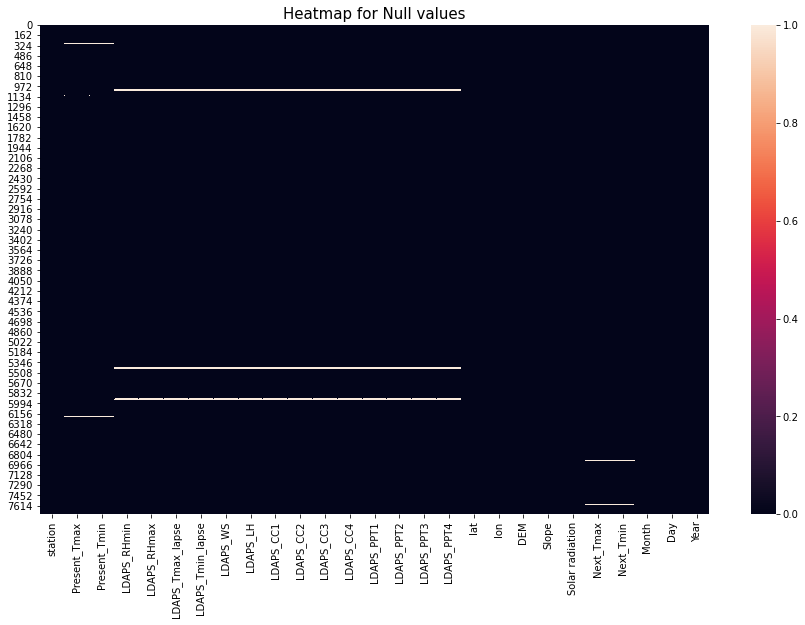

In [18]:
plt.figure(figsize=(15,9))
plt.title('Heatmap for Null values', fontsize=15)
sns.heatmap(df.isnull())

In [20]:
df=df.dropna()

In [21]:
#removing null values

In [23]:
df.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Month               0
Day                 0
Year                0
dtype: int64

There is no null value present in the data

In [24]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Month,Day,Year
count,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,...,7588.000000,7588.00000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000
mean,13.014101,29.748366,23.195809,56.724969,88.360823,29.620128,23.511786,7.094097,62.492606,0.368510,...,37.544792,126.99142,61.918136,1.259755,5343.724208,30.241526,22.910820,7.068134,16.337375,2014.991697
std,7.217858,2.967401,2.400880,14.626559,7.199456,2.943496,2.342579,2.177034,33.686158,0.262260,...,0.050428,0.07922,54.323529,1.372748,429.782561,3.111807,2.482256,2.242389,8.216880,1.410877
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,37.456200,126.82600,12.370000,0.098500,4329.520508,17.400000,11.300000,1.000000,7.000000,2013.000000
25%,7.000000,27.800000,21.600000,45.960243,84.203724,27.673756,22.086820,5.675358,37.206201,0.146546,...,37.510200,126.93700,28.700000,0.271300,5001.485717,28.200000,21.300000,7.000000,8.000000,2014.000000
50%,13.000000,29.900000,23.400000,55.023199,89.784122,29.709537,23.758249,6.547838,56.898324,0.315706,...,37.550700,126.99500,45.716000,0.618000,5441.987305,30.400000,23.100000,7.000000,16.000000,2015.000000
75%,19.000000,32.000000,24.800000,67.115099,93.742725,31.711109,25.155660,8.028960,84.235666,0.574174,...,37.577600,127.04200,59.832400,1.767800,5729.485840,32.600000,24.600000,8.000000,24.000000,2016.000000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,37.645000,127.13500,212.335000,5.178200,5992.895996,38.900000,29.800000,12.000000,31.000000,2017.000000


Observation:

1.Most of our attributes are normally distributed because mean and median values are approximatly same

Few Data Min value is 0, and there are gap between 75% and max in which there are chances of Outliers

# Correlation part

<AxesSubplot:title={'center':'Correlation map'}>

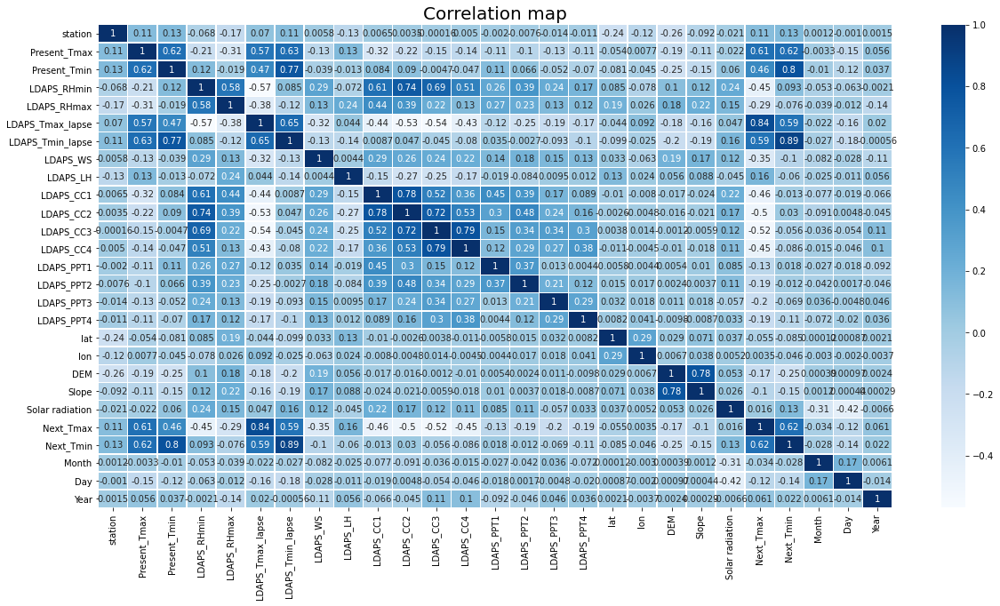

In [30]:
plt.figure(figsize=(20,10))
plt.title('Correlation map',fontsize=20)
sns.heatmap(df.corr(),annot=True,linewidths=.4,cmap='Blues')

observation:

1-Present_Tmax is positively correlated to Next_Tmax,Next_Tmin, LDAPS_Tmin_lapse, LDAPS_Tmax_lapse, Present_Tmin.

2-Present_Tmin is positively correlated to Next_Tmin,Next_Tmax, LDAPS_Tmin_lapse, LDAPS_Tmax_lapse, Present_Tmax.

3-LDAPS_RHmin is negatively correlated to Next_Tmax,LDAPS_Tmax_lapse and positively correlated to LDAPS_RHmax,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4.

4-LDAPS_RHmax is positively correlated to LDAPS_RHmin.

5-LDAPS_Tmax_lapse is positively correlated to Next_Tmin,Next_Tmax,LDAPS_Tmin_lapse,Present_Tmax,Present_Tmin and negatively correlated to LDAPS_CC1, LDAPS_CC2, LDAPS_CC3, LDAPS_CC4,LDAPS_RHmin.

6-LDAPS_Tmin_lapse is positively correlated to Next_Tmin,Next_Tmax,LDAPS_Tmax_lapse,Present_Tmax and Present_Tmin

In [31]:
# Correlation with Target variable

In [32]:
df.corr()['Next_Tmax'].sort_values(ascending=False)

Next_Tmax           1.000000
LDAPS_Tmax_lapse    0.835729
Next_Tmin           0.616629
Present_Tmax        0.610357
LDAPS_Tmin_lapse    0.592119
Present_Tmin        0.463523
LDAPS_LH            0.156779
station             0.107747
Year                0.061211
Solar radiation     0.016145
lon                 0.003502
Month              -0.033684
lat                -0.055367
Slope              -0.104279
Day                -0.122303
LDAPS_PPT1         -0.125954
DEM                -0.174578
LDAPS_PPT2         -0.186722
LDAPS_PPT4         -0.190720
LDAPS_PPT3         -0.203554
LDAPS_RHmax        -0.289788
LDAPS_WS           -0.351107
LDAPS_RHmin        -0.446824
LDAPS_CC4          -0.454039
LDAPS_CC1          -0.459705
LDAPS_CC2          -0.498295
LDAPS_CC3          -0.523061
Name: Next_Tmax, dtype: float64

In [35]:
df.corr()['Next_Tmin'].sort_values(ascending=False)

Next_Tmin           1.000000
LDAPS_Tmin_lapse    0.886513
Present_Tmin        0.796975
Present_Tmax        0.621048
Next_Tmax           0.616629
LDAPS_Tmax_lapse    0.589963
station             0.128184
Solar radiation     0.125517
LDAPS_RHmin         0.093249
LDAPS_CC2           0.030358
Year                0.021617
LDAPS_PPT1          0.018031
LDAPS_PPT2         -0.012462
LDAPS_CC1          -0.012877
Month              -0.028344
lon                -0.045758
LDAPS_CC3          -0.056490
LDAPS_LH           -0.060392
LDAPS_PPT3         -0.068664
LDAPS_RHmax        -0.076415
lat                -0.085136
LDAPS_CC4          -0.086197
LDAPS_WS           -0.102021
LDAPS_PPT4         -0.114900
Day                -0.135865
Slope              -0.148379
DEM                -0.249303
Name: Next_Tmin, dtype: float64

To check positive correlation with the Target variable

<AxesSubplot:title={'center':'Coreelation with Next_Tmax'}>

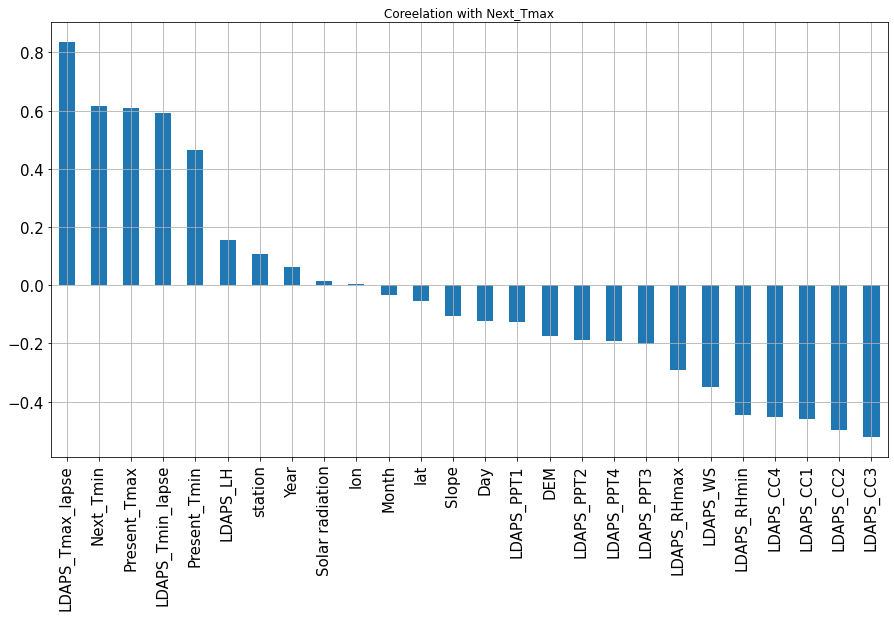

In [36]:
df.corr()['Next_Tmax'].sort_values(ascending=False).drop(['Next_Tmax']).plot.bar(figsize=(15,8),grid=True,title='Coreelation with Next_Tmax',fontsize=15)

1-LDAPS_Tmin_lapse,Present_Tmin,Present_Tmax,Next_Tmax & LDAPS_Tmax_lapse are positively correlated with our target attribute.

2-LDAPS_CC4 ,LDAPS_CC1,LDAPS_CC2 ,LDAPS_CC3 are negatively correlated.

<AxesSubplot:title={'center':'Correlation with Next_Tmin'}>

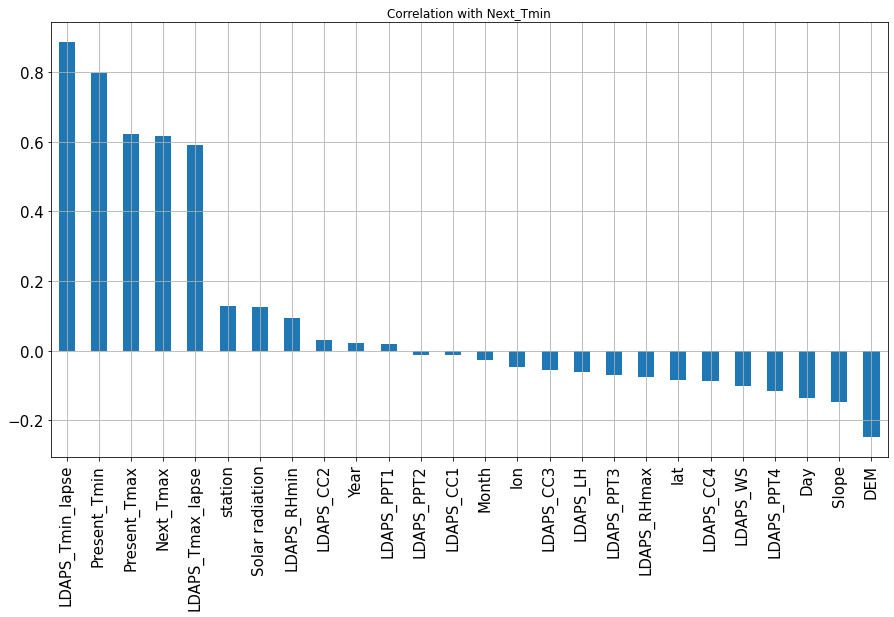

In [39]:
df.corr()['Next_Tmin'].sort_values(ascending=False).drop(['Next_Tmin']).plot.bar(figsize=(15,8),grid=True,title='Correlation with Next_Tmin',fontsize=15)

1-LDAPS_Tmin_lapse,Present_Tmin,Present_Tmax ,Next_Tmax,LDAPS_Tmax_laps are positively correlated with target attribute.

2-DEM, Slope are negatively correlated with target attribute.

# Data Visualization

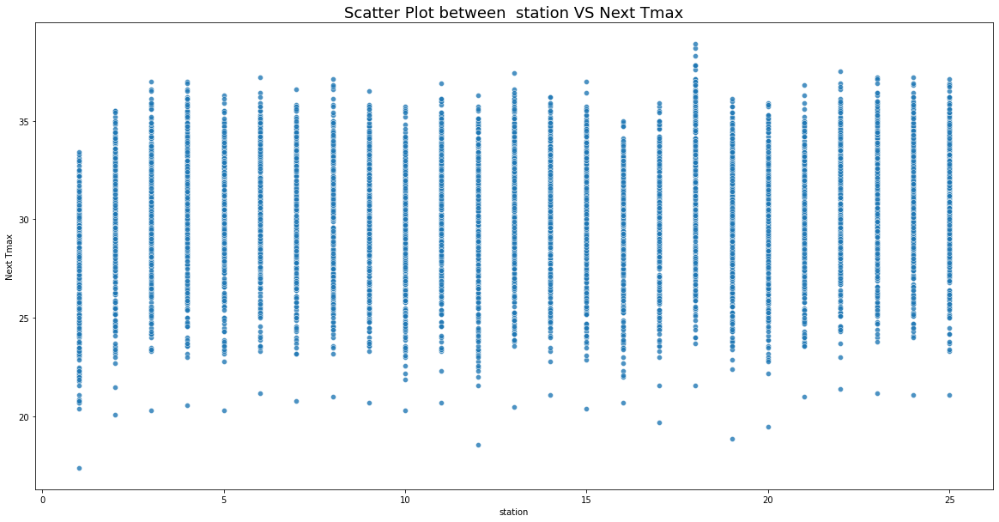

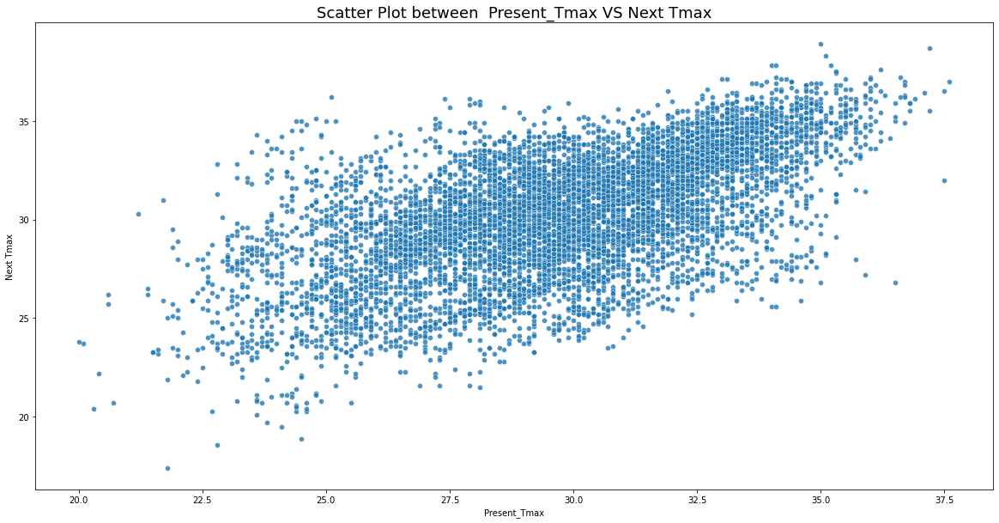

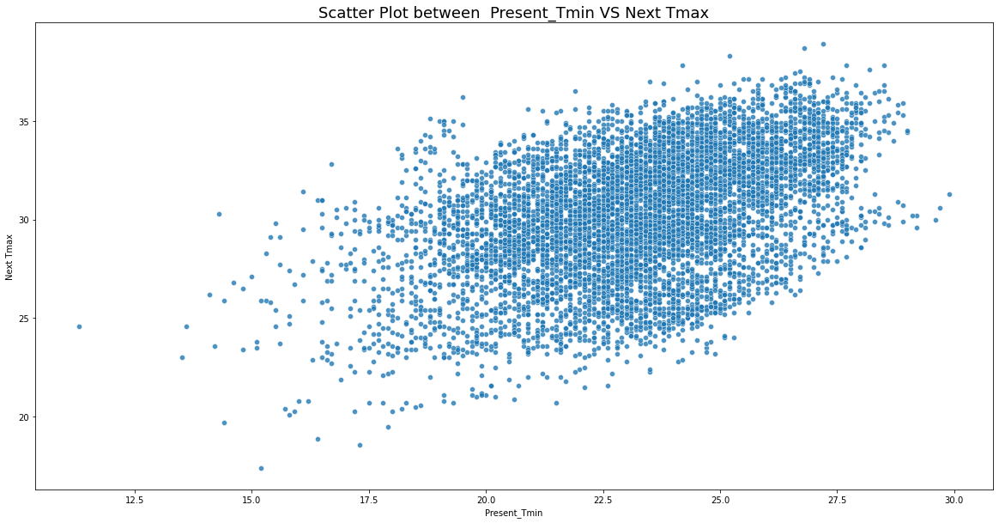

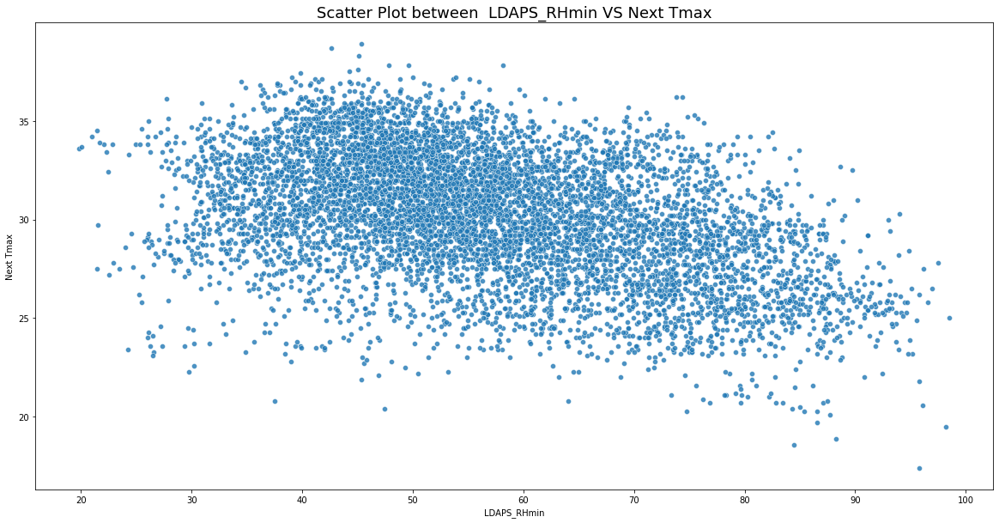

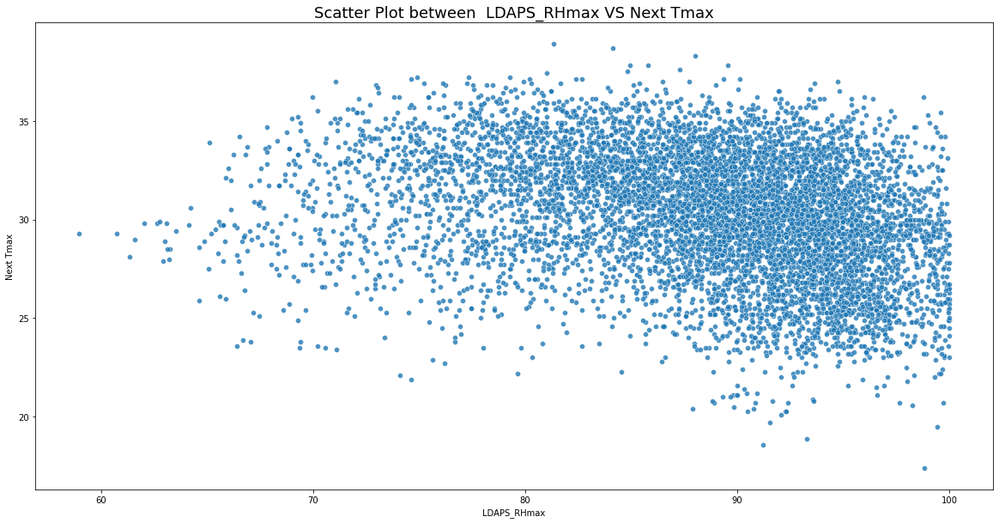

...

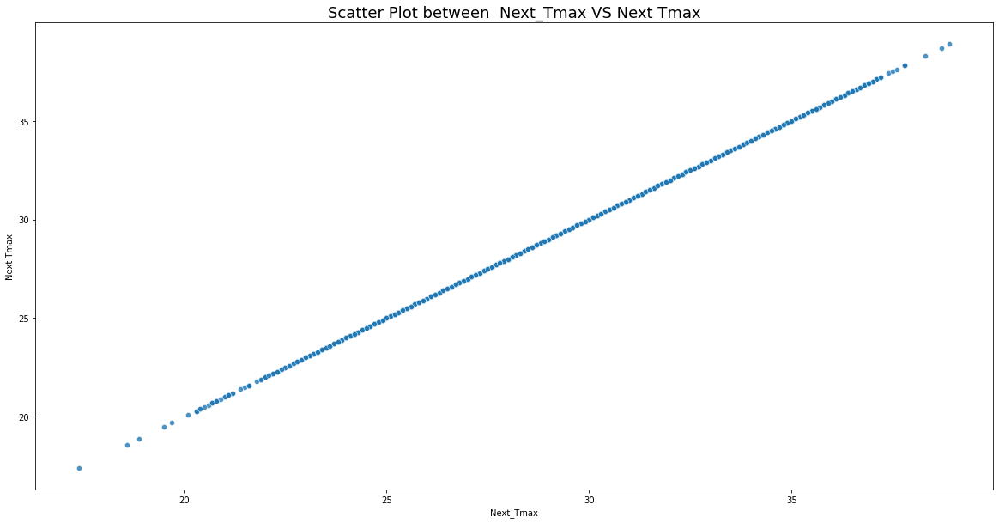

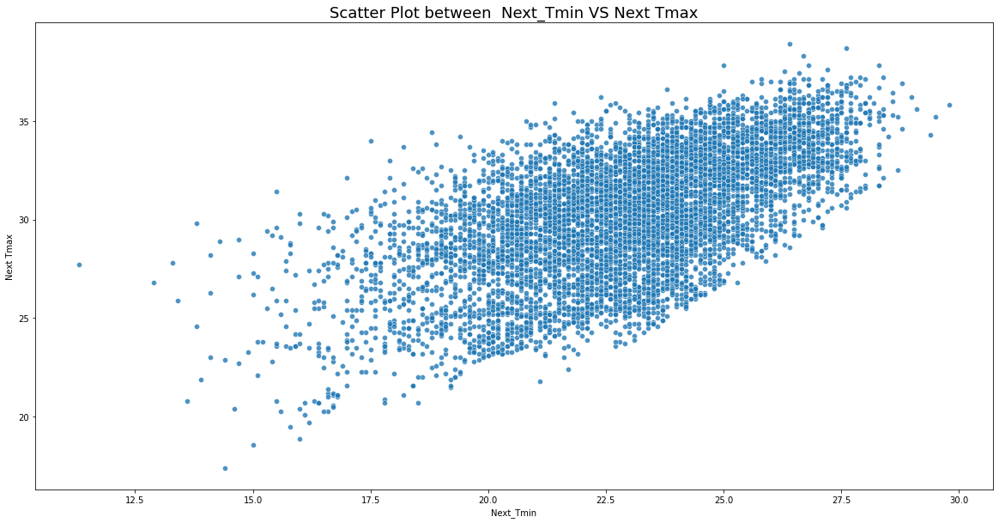

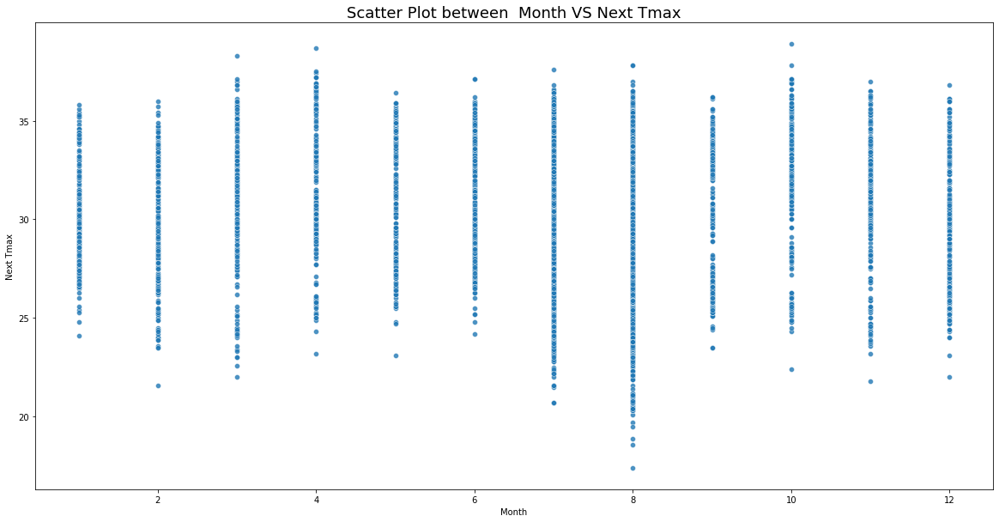

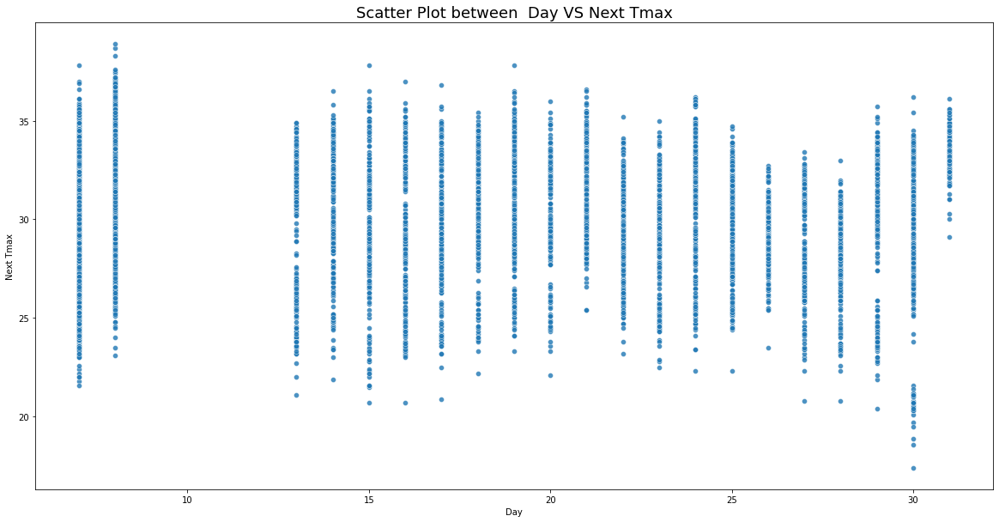

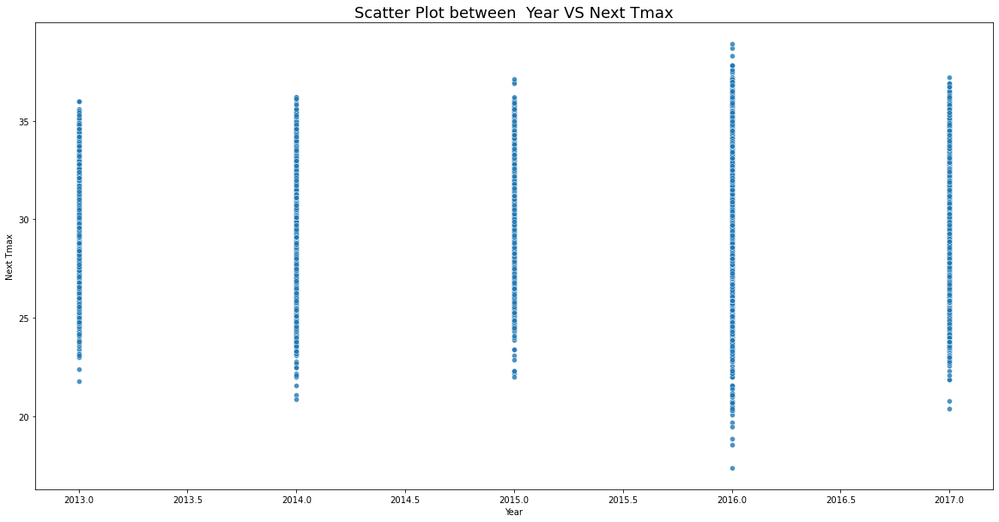

In [40]:
for i in df.columns:                                        
    plt.figure(figsize = (20, 10))
    sns.scatterplot(df[i], df['Next_Tmax'],alpha=0.8, edgecolors='g')
    plt.title('Scatter Plot between  '  +  i +  ' VS Next Tmax',fontsize=18)
    plt.xlabel(i)
    plt.ylabel('Next Tmax')
    plt.show()

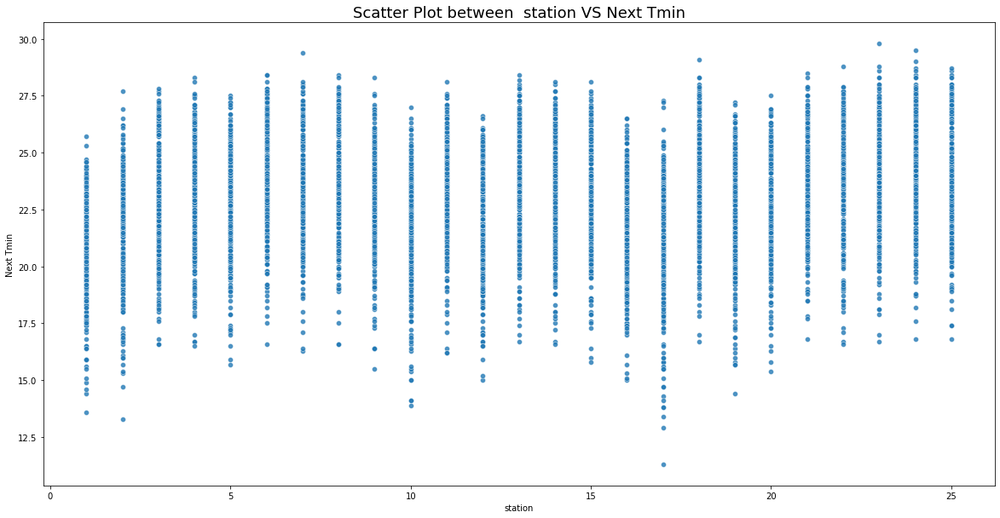

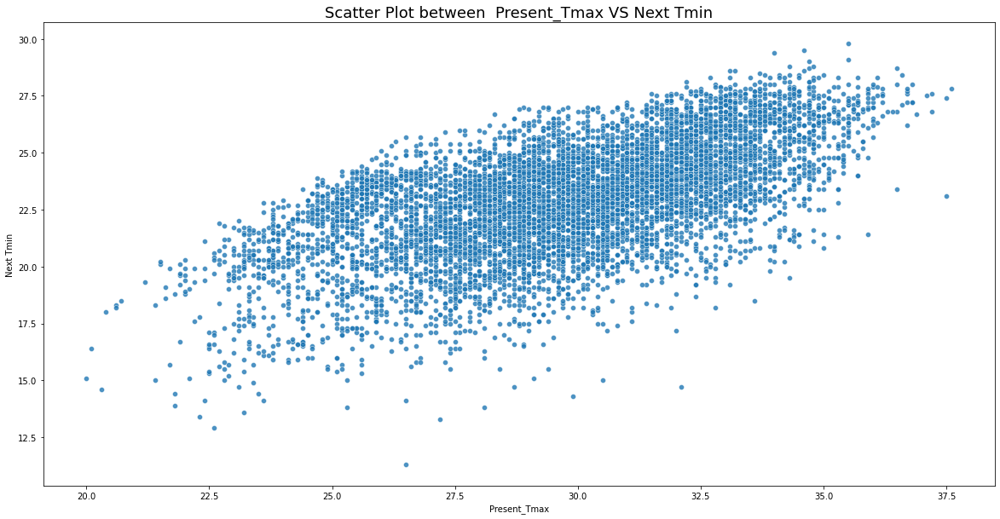

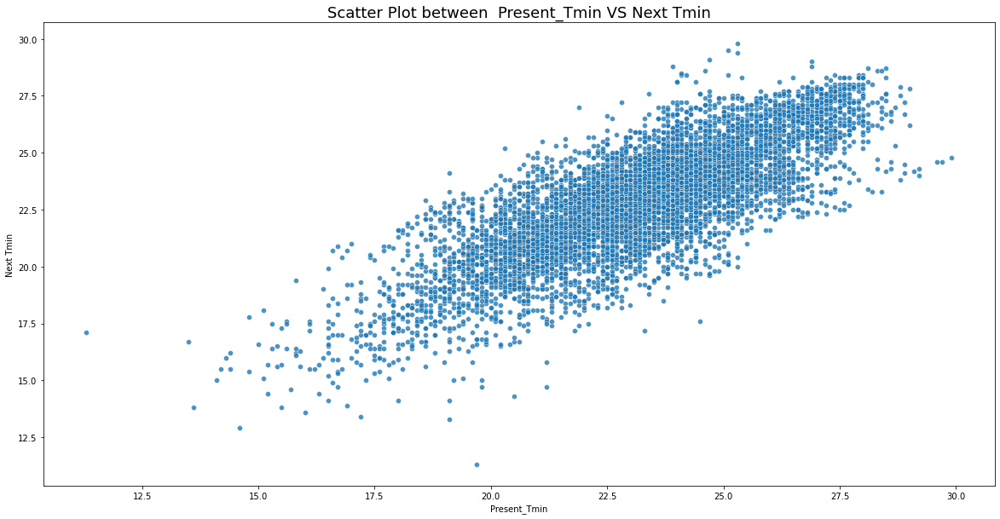

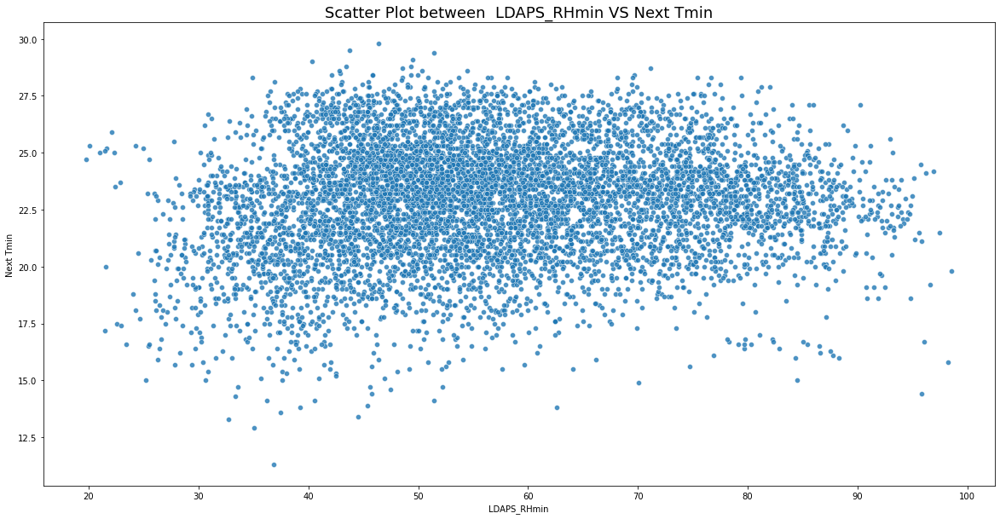

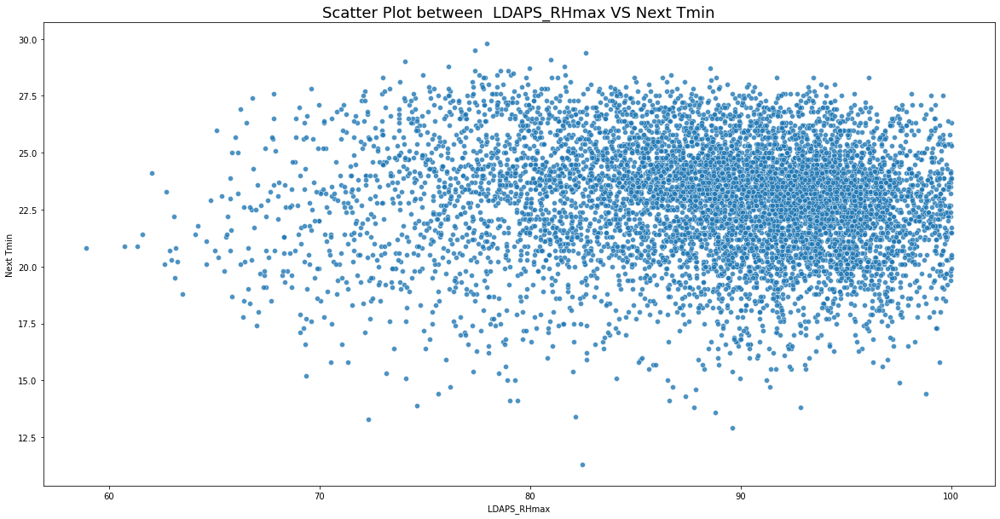

...

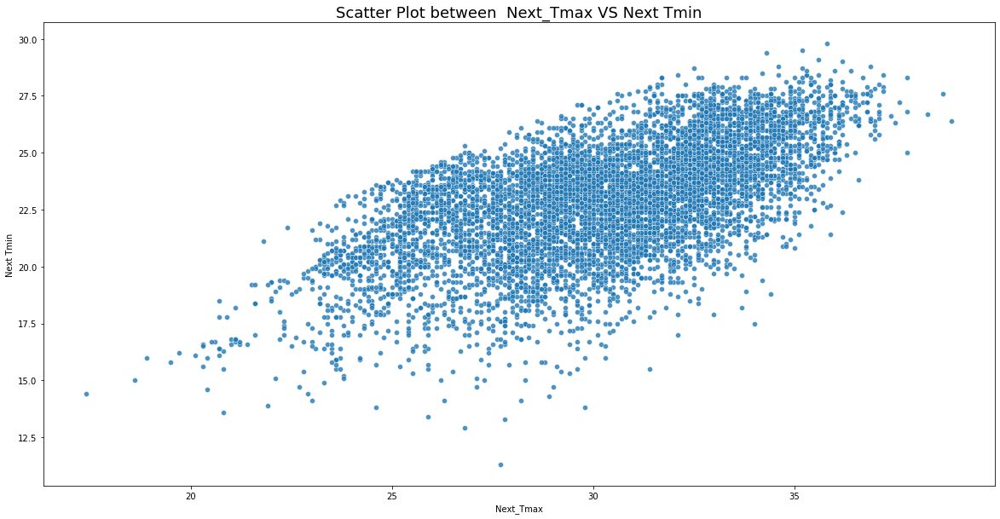

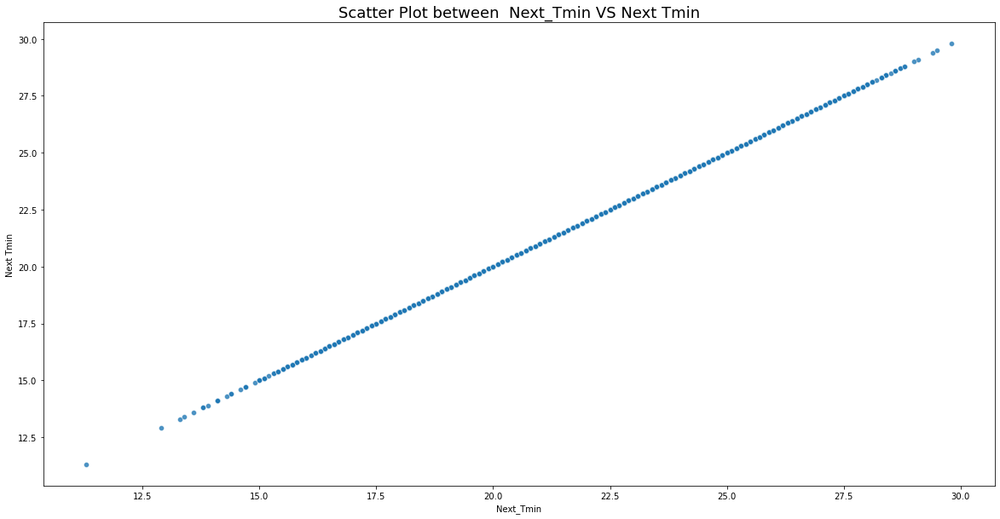

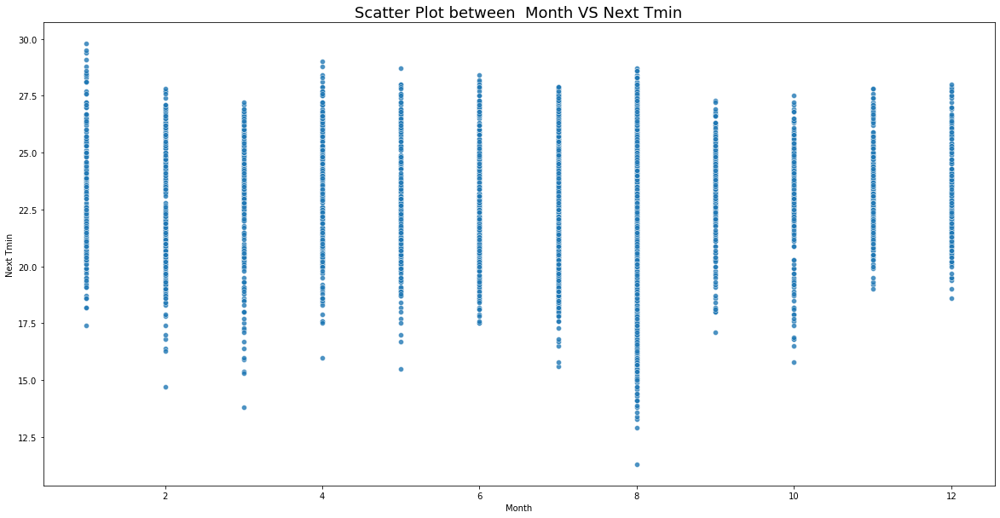

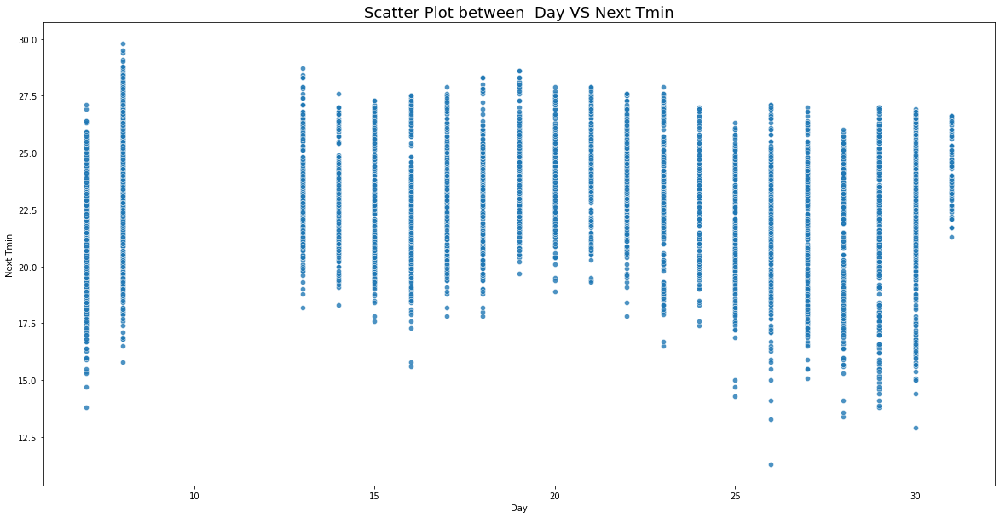

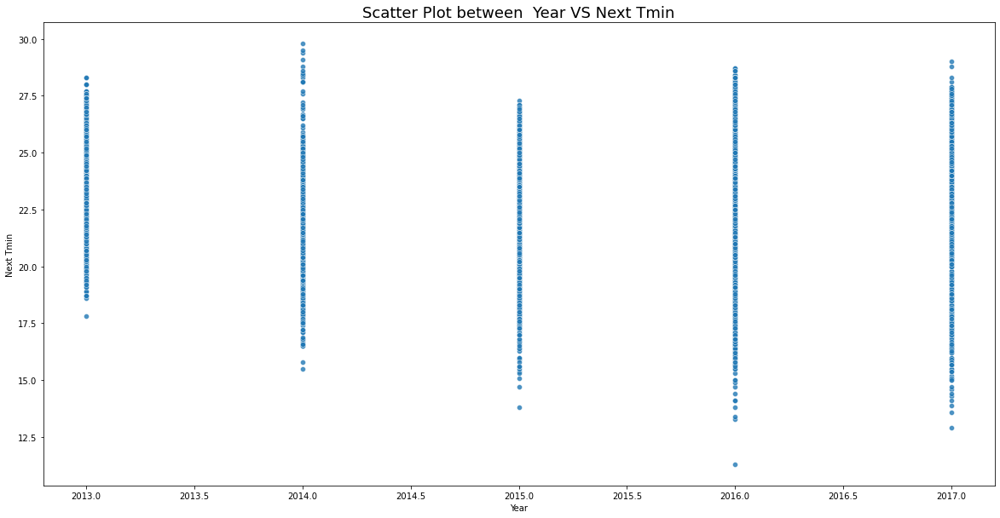

In [41]:
for i in df.columns:                                        
    plt.figure(figsize = (20, 10))
    sns.scatterplot(df[i], df['Next_Tmin'],alpha=0.8, edgecolors='g')
    plt.title('Scatter Plot between  '  +  i +  ' VS Next Tmin',fontsize=18)
    plt.xlabel(i)
    plt.ylabel('Next Tmin')
    plt.show()

# Data Distribution

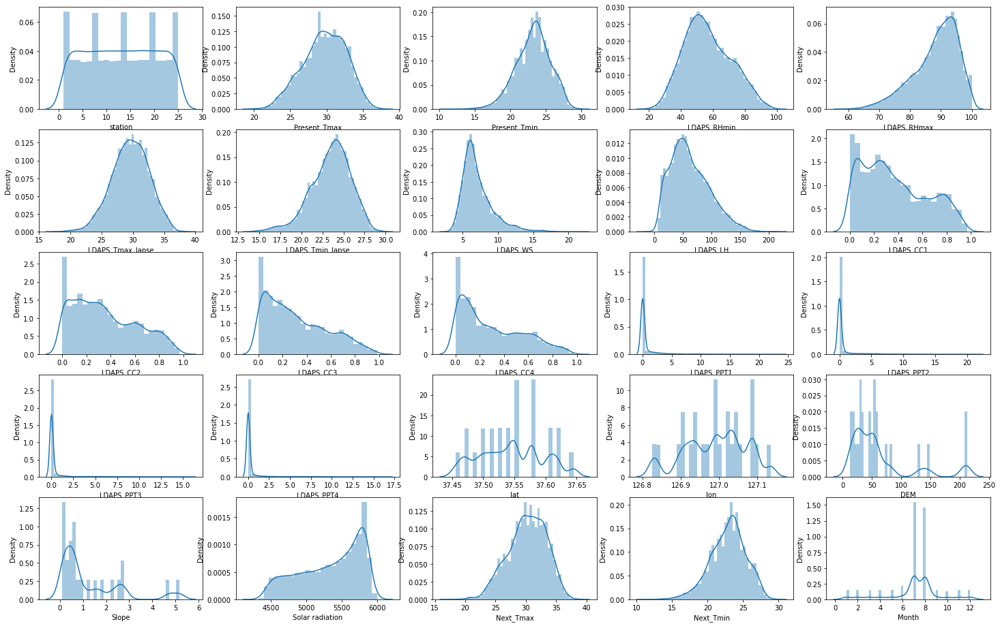

In [42]:
plt.figure(figsize=(25,16))
plot=1
for col in df:
    if plot<=25:
        plt.subplot(5,5,plot)
        sns.distplot(df[col])
        plt.xlabel(col)
        plot=plot+1
plt.show()

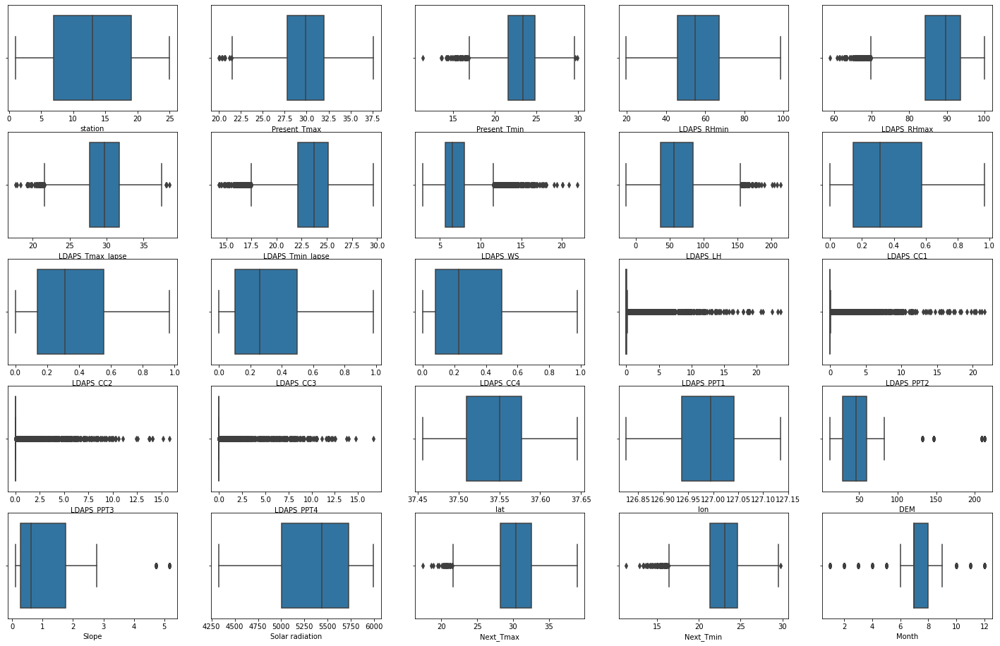

In [43]:
df_n=df.select_dtypes(include=float)
plt.figure(figsize=(25,16))
plot=1
for col in df_n:
    if plot<=25:
        plt.subplot(5,5,plot)
        sns.boxplot(df[col])
        plt.xlabel(col)
        plot=plot+1
plt.show()

In [45]:
def outlier(df,col):
    lower_boundary=df[col].mean()-1.5*df[col].std()
    upper_boundary=df[col].mean()+1.5*df[col].std()
    print(lower_boundary,upper_boundary)
    df.loc[df[col]> upper_boundary,col] = upper_boundary
    df.loc[df[col]<lower_boundary,col]=lower_boundary

In [46]:
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Month', 'Day', 'Year'],
      dtype='object')

In [47]:
outlier(df,'Present_Tmax')
outlier(df,'Present_Tmin')
outlier(df,'LDAPS_RHmax')
outlier(df,'LDAPS_Tmax_lapse')
outlier(df,'LDAPS_Tmin_lapse')
outlier(df,'LDAPS_Tmin_lapse')
outlier(df,'LDAPS_LH')
outlier(df,'DEM')
outlier(df,'LDAPS_PPT1')
outlier(df,'LDAPS_PPT2')
outlier(df,'LDAPS_PPT3')
outlier(df,'LDAPS_PPT4')
outlier(df,'Next_Tmax')
outlier(df,'Next_Tmin')

25.297265048738755 34.1994666328637
19.5944894454293 26.797128899325674
77.56163889397278 99.16000784676278
25.204883595976483 34.03537178416053
19.99791784826333 27.025654464391014
20.543654820889063 26.649368300368966
11.963369563744905 113.02184301223119
-19.567157024962093 143.40342998226683
-2.302357049539244 3.4803730064085117
-2.1342524648031738 3.0957291897934205
-1.4441233664603859 1.9941368154501058
-1.5041190868449061 2.034864145784284
25.57381549013136 34.909236697533395
19.187436448979724 26.63420298170037


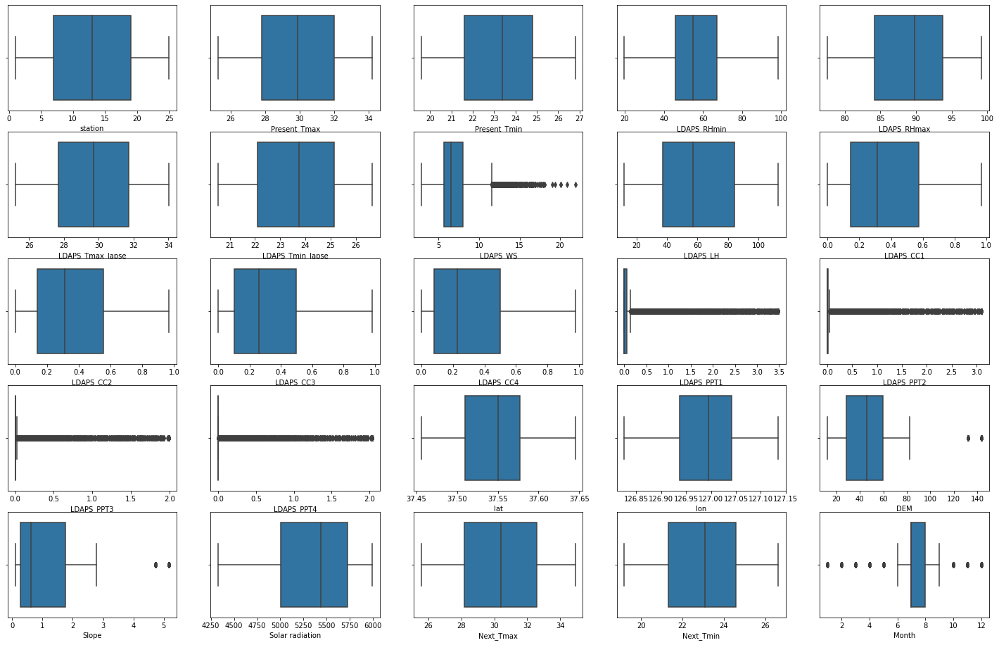

In [48]:
plt.figure(figsize=(25,16))
plot=1
for col in df_n:
    if plot<=25:
        plt.subplot(5,5,plot)
        sns.boxplot(df[col])
        plt.xlabel(col)
        plot=plot+1
plt.show()

Now our Data doesnt have extreme Outliers, we have removed the same

# Skewness

In [49]:
df.skew()

station            -0.004178
Present_Tmax       -0.112021
Present_Tmin       -0.077934
LDAPS_RHmin         0.301396
LDAPS_RHmax        -0.376620
LDAPS_Tmax_lapse   -0.051266
LDAPS_Tmin_lapse   -0.110188
LDAPS_WS            1.553926
LDAPS_LH            0.244343
LDAPS_CC1           0.456716
LDAPS_CC2           0.473929
LDAPS_CC3           0.639649
LDAPS_CC4           0.663815
LDAPS_PPT1          2.557293
LDAPS_PPT2          2.941554
LDAPS_PPT3          3.355054
LDAPS_PPT4          3.482011
lat                 0.085377
lon                -0.289048
DEM                 1.198427
Slope               1.559050
Solar radiation    -0.524325
Next_Tmax          -0.131335
Next_Tmin          -0.083377
Month              -0.703092
Day                 0.245563
Year                0.013575
dtype: float64

In [50]:
for col in df.columns:
    if df.skew().loc[col]>0.55:
        df[col]=np.log1p(df[col])

In [51]:
df.skew()

station            -0.004178
Present_Tmax       -0.112021
Present_Tmin       -0.077934
LDAPS_RHmin         0.301396
LDAPS_RHmax        -0.376620
LDAPS_Tmax_lapse   -0.051266
LDAPS_Tmin_lapse   -0.110188
LDAPS_WS            0.681138
LDAPS_LH            0.244343
LDAPS_CC1           0.456716
LDAPS_CC2           0.473929
LDAPS_CC3           0.388007
LDAPS_CC4           0.441501
LDAPS_PPT1          2.179271
LDAPS_PPT2          2.580184
LDAPS_PPT3          2.996215
LDAPS_PPT4          3.124208
lat                 0.085377
lon                -0.289048
DEM                 0.180320
Slope               0.833888
Solar radiation    -0.524325
Next_Tmax          -0.131335
Next_Tmin          -0.083377
Month              -0.703092
Day                 0.245563
Year                0.013575
dtype: float64

In [52]:
x=df.drop(['Next_Tmax'],axis=1)
y=df[['Next_Tmax']]

# Scaling

In [53]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
x_scaled=ss.fit_transform(x)
x=pd.DataFrame(x_scaled,columns=x.columns)
x

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin,Month,Day,Year
0,-1.664607,-0.411513,-0.872794,0.104660,0.373881,-0.608138,-0.319839,-0.013778,0.285711,-0.513123,...,-0.34754,1.186076,-0.005302,1.709366,1.305103,1.510565,-0.813931,-0.476369,1.662861,-1.411767
1,-1.526052,0.779395,-0.778486,-0.305052,0.292344,0.072032,0.216219,-0.654195,-0.297099,-0.545304,...,-0.34754,1.186076,0.512280,0.003011,-0.510311,1.222997,-0.218133,-0.476369,1.662861,-1.411767
2,-1.387498,0.667748,0.023134,-0.549344,-0.764425,0.164147,0.492897,-0.388527,-1.340786,-0.606944,...,-0.34754,0.650626,0.840503,-0.424813,-0.864745,1.209602,0.423497,-0.476369,1.662861,-1.411767
3,-1.248943,0.816611,0.070288,0.103573,1.229244,0.016112,-0.153380,-0.680001,0.161769,-0.580143,...,-0.34754,1.987268,0.386040,0.033635,1.169596,1.194265,0.606820,-0.476369,1.662861,-1.411767
4,-1.110389,0.593316,-0.637023,-0.037665,0.220694,-0.210036,-0.069795,-0.627771,1.567301,-0.827872,...,-0.34754,0.117159,1.812547,-0.351712,-0.521597,1.200286,-0.218133,-0.476369,1.662861,-1.411767
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7583,1.106481,-1.677871,-1.724166,-2.190405,-1.674749,-0.708217,-1.604243,-0.128847,-1.627284,-1.203497,...,-0.34754,0.117159,0.613271,-0.764155,-0.435828,-2.065599,-1.736303,0.415596,1.662861,1.423537
7584,1.245036,-1.677871,-1.724166,-1.820788,-0.809616,-1.132338,-1.604243,-0.607612,0.708149,-1.151793,...,-0.34754,-0.686016,1.193973,-1.020689,-1.084474,-2.098689,-1.736303,0.415596,1.662861,1.423537
7585,1.383590,-1.677871,-1.724166,-2.050081,-1.577780,-1.267417,-1.604243,-0.382367,0.372445,-1.290699,...,-0.34754,-0.150566,-1.267697,-1.503863,-1.046033,-2.095175,-1.736303,0.415596,1.662861,1.423537
7586,1.522145,-1.677871,-1.724166,-2.234735,-1.786264,-1.015457,-1.604243,-0.161682,-0.453364,-1.268430,...,-0.34754,-0.418291,-1.040466,-1.358337,-0.934504,-2.106671,-1.736303,0.415596,1.662861,1.423537


# Model Building

In [54]:
from sklearn.linear_model import LinearRegression,Lasso,Ridge,ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score,accuracy_score
from sklearn.model_selection import cross_val_score,GridSearchCV,train_test_split

In [55]:
def maxr2_score(clf,x,y):
    maxr2_score1=0
    for i in range(42,100):
        x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.20,random_state=i)
        clf.fit(x_train,y_train)
        pred=clf.predict(x_test)
        r2_cscore=r2_score(y_test,pred)
        if r2_cscore>maxr2_score1:
            maxr2_score1=r2_cscore
            final_r=i
    print('max r2 score corresponding to',final_r,'is',maxr2_score1)
    print('cross validation score',cross_val_score(clf,x,y,scoring='r2').mean())
    print('Standard Deviation',cross_val_score(clf,x,y,scoring='r2').std())
    print('Training accuracy',clf.score(x_train,y_train))
    print('Test Accuracy',clf.score(x_test,y_test))
    print('MAE',mean_absolute_error(y_test,pred))
    print('MSE',mean_squared_error(y_test,pred))
    print('RMSE',np.sqrt(mean_squared_error(y_test,pred)))
    
    return final_r

In [56]:
# Linerar regression
lr=LinearRegression()
maxr2_score(lr,x,y)

max r2 score corresponding to 71 is 0.803875030187891
cross validation score 0.6968752742901558
Standard Deviation 0.06649451783963314
Training accuracy 0.7806330596435564
Test Accuracy 0.7908866985324206
MAE 0.9999300485863967
MSE 1.7261037455196357
RMSE 1.3138126752013148


71

In [57]:
## ridge regression
ridge=Ridge()
maxr2_score(ridge,x,y)

max r2 score corresponding to 71 is 0.8038603694938249
cross validation score 0.696904825375287
Standard Deviation 0.0665090032122127
Training accuracy 0.7806329697075672
Test Accuracy 0.7908854186392464
MAE 0.9999437311623
MSE 1.7261143102631797
RMSE 1.3138166958381903


71

In [58]:
##Decision Tree Regressor
dt=DecisionTreeRegressor()
maxr2_score(dt,x,y)

max r2 score corresponding to 82 is 0.8205722946203098
cross validation score 0.4015235022377821
Standard Deviation 0.1405020354638359
Training accuracy 1.0
Test Accuracy 0.8078869302814206
MAE 0.8703961321440242
MSE 1.585777121193444
RMSE 1.2592764276335215


82

In [59]:
## KNN
knn=KNeighborsRegressor()
maxr2_score(knn,x,y)

max r2 score corresponding to 84 is 0.900901259670091
cross validation score 0.5466804616990482
Standard Deviation 0.10418493757029001
Training accuracy 0.9267487284923266
Test Accuracy 0.8899185477194871
MAE 0.706479974549684
MSE 0.908655765846122
RMSE 0.9532343708900356


84

In [64]:
## Adaboost Regessor
adb=AdaBoostRegressor()
maxr2_score(adb,x,y)

max r2 score corresponding to 65 is 0.7481904966676295
cross validation score 0.6394621728099692
Standard Deviation 0.062014407517157526
Training accuracy 0.7247157438046887
Test Accuracy 0.7241768682665797
MAE 1.2716546557395996
MSE 2.2767530207055064
RMSE 1.5088913217013034


65

In [65]:
## sUPPORT vECTOR
svm=SVR()
maxr2_score(svm,x,y)

max r2 score corresponding to 84 is 0.9080690225848786
cross validation score 0.6808838026806467
Standard Deviation 0.0829008454906741
Training accuracy 0.9151327367980525
Test Accuracy 0.901728311866322
MAE 0.6482586742053593
MSE 0.8111733102371681
RMSE 0.9006516031391761


84

In [68]:
r_2_score=[80.38,80.38,82.05,90.09,90.80,74.81]
cross=[69.69,69.69,40.15,54.66,68.08,63.94]

model=['Linear Regression','Ridge','Decision Tree','KNN','Support vector','Adaboost']
best_model=pd.DataFrame({'Model':model,'R2_score':r_2_score,'CRoss validation':cross})
best_model

,Model,R2_score,CRoss validation
0,Linear Regression,80.38,69.69
1,Ridge,80.38,69.69
2,Decision Tree,82.05,40.15
3,KNN,90.09,54.66
4,Support vector,90.80,68.08
5,Adaboost,74.81,63.94


Based on the above results, we can go with Linear Regression or Ridge as 
our best model as it has less difference

# Hyperparameter Tuning

In [67]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.20,random_state=71)

In [69]:
from sklearn.linear_model import Ridge
parameters = {'alpha':[.0001,.001,.01,.1,1,10],'random_state':list(range(0,10))}
ridge_1=Ridge()
clf=GridSearchCV(ridge_1,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'alpha': 10, 'random_state': 0}


In [70]:
r_1=Ridge(alpha=10,random_state=0)
r_1.fit(x_train,y_train)
r_1.score(x_train,y_train)
pred=r_1.predict(x_test)
rs=r2_score(y_test,pred)
rs

0.8037247083686627

# Saving the Model

In [71]:
import joblib
joblib.dump('r_1','temp_r.pkl')

['temp_r.pkl']

In [72]:
loaded_model=joblib.load('temp_r.pkl')

# Next T_min is our Targe Attribute

In [73]:
x1=df.drop(['Next_Tmin'],axis=1)
y1=df[['Next_Tmin']]

In [74]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
x_scaled=ss.fit_transform(x1)
x1=pd.DataFrame(x_scaled,columns=x1.columns)
x1

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Month,Day,Year
0,-1.664607,-0.411513,-0.872794,0.104660,0.373881,-0.608138,-0.319839,-0.013778,0.285711,-0.513123,...,-0.34754,1.186076,-0.005302,1.709366,1.305103,1.510565,-0.432819,-0.476369,1.662861,-1.411767
1,-1.526052,0.779395,-0.778486,-0.305052,0.292344,0.072032,0.216219,-0.654195,-0.297099,-0.545304,...,-0.34754,1.186076,0.512280,0.003011,-0.510311,1.222997,0.065604,-0.476369,1.662861,-1.411767
2,-1.387498,0.667748,0.023134,-0.549344,-0.764425,0.164147,0.492897,-0.388527,-1.340786,-0.606944,...,-0.34754,0.650626,0.840503,-0.424813,-0.864745,1.209602,0.279214,-0.476369,1.662861,-1.411767
3,-1.248943,0.816611,0.070288,0.103573,1.229244,0.016112,-0.153380,-0.680001,0.161769,-0.580143,...,-0.34754,1.987268,0.386040,0.033635,1.169596,1.194265,0.492824,-0.476369,1.662861,-1.411767
4,-1.110389,0.593316,-0.637023,-0.037665,0.220694,-0.210036,-0.069795,-0.627771,1.567301,-0.827872,...,-0.34754,0.117159,1.812547,-0.351712,-0.521597,1.200286,0.314816,-0.476369,1.662861,-1.411767
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7583,1.106481,-1.677871,-1.724166,-2.190405,-1.674749,-0.708217,-1.604243,-0.128847,-1.627284,-1.203497,...,-0.34754,0.117159,0.613271,-0.764155,-0.435828,-2.065599,-0.966843,0.415596,1.662861,1.423537
7584,1.245036,-1.677871,-1.724166,-1.820788,-0.809616,-1.132338,-1.604243,-0.607612,0.708149,-1.151793,...,-0.34754,-0.686016,1.193973,-1.020689,-1.084474,-2.098689,-0.824437,0.415596,1.662861,1.423537
7585,1.383590,-1.677871,-1.724166,-2.050081,-1.577780,-1.267417,-1.604243,-0.382367,0.372445,-1.290699,...,-0.34754,-0.150566,-1.267697,-1.503863,-1.046033,-2.095175,-0.717632,0.415596,1.662861,1.423537
7586,1.522145,-1.677871,-1.724166,-2.234735,-1.786264,-1.015457,-1.604243,-0.161682,-0.453364,-1.268430,...,-0.34754,-0.418291,-1.040466,-1.358337,-0.934504,-2.106671,-0.610827,0.415596,1.662861,1.423537


In [75]:
# Linerar regression
lr_1=LinearRegression()
maxr2_score(lr_1,x1,y1)

max r2 score corresponding to 62 is 0.8589383272353126
cross validation score 0.7858732058601475
Standard Deviation 0.0896876007095831
Training accuracy 0.8413371999860337
Test Accuracy 0.8494064689476155
MAE 0.6698074823146194
MSE 0.7353136979679854
RMSE 0.8575043428274782


62

In [76]:
## ridge regression
ridge_1=Ridge()
maxr2_score(ridge_1,x1,y1)

max r2 score corresponding to 62 is 0.8589316823947961
cross validation score 0.7858890228788621
Standard Deviation 0.08966843711352782
Training accuracy 0.8413371632747689
Test Accuracy 0.8494048512142528
MAE 0.6698235933119093
MSE 0.735321596989231
RMSE 0.8575089486350747


62

In [77]:
##Decision Tree Regressor
dt_1=DecisionTreeRegressor()
maxr2_score(dt_1,x1,y1)

max r2 score corresponding to 62 is 0.8341543057945408
cross validation score 0.5987799299966581
Standard Deviation 0.14988216523557674
Training accuracy 1.0
Test Accuracy 0.8007719341102397
MAE 0.7003549017827589
MSE 0.9727849851495293
RMSE 0.9862986287882232


62

In [78]:
## KNN
knn_1=KNeighborsRegressor()
maxr2_score(knn_1,x1,y1)

max r2 score corresponding to 70 is 0.9040717720661327
cross validation score 0.6096322503174095
Standard Deviation 0.14927889942330738
Training accuracy 0.9238600570282499
Test Accuracy 0.8962462483585661
MAE 0.5399067939886397
MSE 0.506605790198095
RMSE 0.7117624534899935


70

In [79]:
## Adaboost Regessor
adb_1=AdaBoostRegressor()
maxr2_score(adb_1,x1,y1)

max r2 score corresponding to 68 is 0.812011817027136
cross validation score 0.7251847719660414
Standard Deviation 0.0803887946964865
Training accuracy 0.804652338602442
Test Accuracy 0.8075262035167756
MAE 0.8140952198656894
MSE 0.9398054356317995
RMSE 0.9694356273790434


68

In [80]:
r_2_score=[85.89,85.89,83.41,83.41,90.40,81.20]
cross=[78.58,78.58,59.87,59.87,60.96,72.51]

model=['Linear Regression','Ridge','Decision Tree','KNN','Support vector','Adaboost']
best_model=pd.DataFrame({'Model':model,'R2_score':r_2_score,'CRoss validation':cross})
best_model

,Model,R2_score,CRoss validation
0,Linear Regression,85.89,78.58
1,Ridge,85.89,78.58
2,Decision Tree,83.41,59.87
3,KNN,83.41,59.87
4,Support vector,90.40,60.96
5,Adaboost,81.20,72.51


Based on the above results, we can go with Linear Regression or Ridge as our best model as it has less difference

# Hyperparameter Tuning

In [81]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.20,random_state=71)

In [83]:
from sklearn.linear_model import Ridge
parameters = {'alpha':[.0001,.001,.01,.1,1,10],'random_state':list(range(0,10))}
ridge_1=Ridge()
clf=GridSearchCV(ridge_1,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'alpha': 10, 'random_state': 0}


In [84]:
r_1=Ridge(alpha=10,random_state=0)
r_1.fit(x_train,y_train)
r_1.score(x_train,y_train)
pred=r_1.predict(x_test)
rs=r2_score(y_test,pred)
rs

0.8037247083686627

# Saving the Model


In [85]:
import joblib
joblib.dump('r_1','temp_r.pkl')


['temp_r.pkl']

In [86]:
loaded_model=joblib.load('temp_r.pkl')